## 1. Environment Setup and Data Loading

### 1.1 Import Required Libraries

In [1]:
import pandas as pd
import numpy as np
import ast
import re
import html
import string
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import re
from collections import Counter
from nltk.corpus import stopwords
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
import warnings
warnings.filterwarnings('ignore')

### 1.2 Load Dataset

In [2]:
df=pd.read_csv('/kaggle/input/df-eda/df_eda.csv')

## 2. Initial Data Exploration

### 2.1 Preview the Dataset

In [3]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,item_id,rate_missing,rate_missing_label,is_chain,chain_size,num_of_rest_types,cuisines_count,chain_label,cuisines_list,rate_group
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,0,False,Available,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5
1,spice elephant,Yes,No,4.1,787,banashankari,casual dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","chinese, north indian, thai",800.0,...,1,False,Available,1,4,1,3,Chain,"['chinese', 'north indian', 'thai']",4-5
2,san churro cafe,Yes,No,3.8,918,banashankari,cafe& casual dining,"Churros, Cannelloni, Minestrone Soup, Hot Choc...","cafe, italian, mexican",800.0,...,2,False,Available,1,11,2,3,Chain,"['cafe', 'italian', 'mexican']",3-4
3,addhuri udupi bhojana,No,No,3.7,88,banashankari,quick bites,Masala Dosa,"north indian, south indian",300.0,...,3,False,Available,1,2,1,2,Chain,"['north indian', 'south indian']",3-4
4,grand village,No,No,3.8,166,basavanagudi,casual dining,"Panipuri, Gol Gappe","north indian, rajasthani",600.0,...,4,False,Available,1,4,1,2,Chain,"['north indian', 'rajasthani']",3-4


### 2.2 Check for Missing Values

In [4]:
df.isnull().sum()

name                      0
online_order              0
book_table                0
rate                  10052
votes                     0
location                 21
rest_type               227
dish_liked            28078
cuisines                 45
cost2pepole             346
reviews_list              0
type                      0
city                      0
item_id                   0
rate_missing              0
rate_missing_label        0
is_chain                  0
chain_size                0
num_of_rest_types         0
cuisines_count            0
chain_label               0
cuisines_list             0
rate_group            10052
dtype: int64

## 3. Data Preprocessing and Parsing

### 3.1 Understanding the Reviews Structure

In [5]:
df['reviews_list'].unique()

array(['[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.\'), (\'Rated 4.0\', \'RATED\\n  I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\\nCheers\'), (\'Rated 2.0\', \'RATED\\n  Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said th

In [6]:
type(df['reviews_list'].iloc[0])

str

### 3.2 Parse Reviews from String to List

In [7]:
def parse_reviews(x):
    try:
        return ast.literal_eval(x)
    except:
        return []

df['parsed_reviews'] =df['reviews_list'].apply(parse_reviews)

In [8]:
type(df.loc[0, 'parsed_reviews'])

list

In [9]:
len(df.loc[0, 'parsed_reviews'])

12

### 3.3 Explode Reviews into Individual Rows
###  Each review tuple becomes a separate row for granular analysis.

In [10]:
df_exploded = df.explode('parsed_reviews').reset_index(drop=True)

In [11]:
type(df_exploded.loc[0, 'parsed_reviews'])

tuple

## 4. Review Text Extraction and Cleaning

### 4.1 Define Text Processing Functions

###  Extract rating and review text from tuples, handle encoding issues, and clean the text.

In [12]:
def fix_encoding(text):
    try: 
        text = text.encode('latin1').decode('utf-8')
    except:
        pass
    return text

In [13]:
def extract_rating_text(x):

    if x is None or pd.isna(x):
        return pd.Series([np.nan, None])

    if isinstance(x, list) and len(x) > 0:
        x = x[0]

    if not isinstance(x, tuple) or len(x) < 2:
        return pd.Series([np.nan, None])

    rating_raw, text = x

    text = str(text)

    text = fix_encoding(text)
    text = re.sub(r'^\s*(RATED|REVIEWED|REVIEW)\s*\n*', '', text, flags=re.IGNORECASE)
    text = re.sub(r'[^A-Za-z0-9\s.,]', ' ', text).strip()
    match = re.search(r'(\d+(\.\d+)?)', str(rating_raw))
    rating = float(match.group(1)) if match else np.nan
    return pd.Series([rating, text])

In [14]:
df_exploded[['review_rating', 'review_text']] = (
    df_exploded['parsed_reviews'].apply(extract_rating_text)
)


### 4.2 Verify Data Structure

In [15]:
df_exploded

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,is_chain,chain_size,num_of_rest_types,cuisines_count,chain_label,cuisines_list,rate_group,parsed_reviews,review_rating,review_text
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n A beautiful place to dine...",4.0,A beautiful place to dine in.The interiors tak...
1,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n I was here for dinner wit...",4.0,I was here for dinner with my family on a week...
2,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 2.0, RATED\n Its a restaurant near to ...",2.0,Its a restaurant near to Banashankari BDA. Me ...
3,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n We went here on a weekend...",4.0,We went here on a weekend and one of us had th...
4,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 5.0, RATED\n The best thing about the ...",5.0,The best thing about the place is it ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1327641,chime - sheraton grand bengaluru whitefield ho...,No,Yes,4.3,236,"itpl main road, whitefield",bar,"Cocktails, Pizza, Buttermilk",finger food,2500.0,...,1,3,1,1,Chain,['finger food'],4-5,"(Rated 5.0, RATED\n My review based on food d...",5.0,My review based on food drink service\n\nFood ...
1327642,chime - sheraton grand bengaluru whitefield ho...,No,Yes,4.3,236,"itpl main road, whitefield",bar,"Cocktails, Pizza, Buttermilk",finger food,2500.0,...,1,3,1,1,Chain,['finger food'],4-5,"(Rated 5.0, RATED\n I visited chime bar at Sh...",5.0,I visited chime bar at Sheraton hotel it was n...
1327643,chime - sheraton grand bengaluru whitefield ho...,No,Yes,4.3,236,"itpl main road, whitefield",bar,"Cocktails, Pizza, Buttermilk",finger food,2500.0,...,1,3,1,1,Chain,['finger food'],4-5,"(Rated 4.0, RATED\n This restaurant is situat...",4.0,This restaurant is situated inside grand Shera...
1327644,the nest - the den bengaluru,No,No,3.4,13,"itpl main road, whitefield",bar& casual dining,NaN,"continental, finger food, north indian",1500.0,...,1,2,2,3,Chain,"['continental', 'finger food', 'north indian']",3-4,"(Rated 5.0, RATED\n Great ambience , looking ...",5.0,"Great ambience , looking nice good selection o..."


### 4.3 Inspect Extracted Review Texts

In [16]:
df_exploded['review_text'].head(50)


0     A beautiful place to dine in.The interiors tak...
1     I was here for dinner with my family on a week...
2     Its a restaurant near to Banashankari BDA. Me ...
3     We went here on a weekend and one of us had th...
4     The best thing about the place is it          ...
5     Great food and pleasant ambience. Expensive bu...
6     Good ambience with tasty food.\nCheese chilli ...
7     You can                        t go wrong with...
8     Overdelighted by the service and food provided...
9     The place is nice and comfortable. Food wise a...
10    The place is nice and comfortable. Food wise a...
11    The place is nice and comfortable. Food wise a...
12    Had been here for dinner with family. Turned o...
13    The ambience is really nice, staff is courteou...
14    I felt good is little expensive for the quanti...
15    I was looking for a quite place to spend some ...
16    Nice place to dine and has a good ambiance... ...
17    This place just cool   with good ambience 

In [17]:
df_exploded['review_text'].tail(50)

1327596    Good time to Hangout and party and to have fun...
1327597    We had a great time bowling here. It s a fun p...
1327598    Nice place to hangout with kids. It is in one ...
1327599    This pub is available near the bowling alley a...
1327600    Excellent place had nice time with friends don...
1327601    Service is vary bad and food was pathetic food...
1327602    We went there for a quick drink because we are...
1327603    Came here alone one day morning unplanned  not...
1327604    If you re looking for a quick beer hug, and so...
1327605    Nice place to chill out alone                 ...
1327606    EXCELLENT SERVICES BY STEWARDS. VERY EXPENSIVE...
1327607    Awesome we enjoyed a lot with friends good foo...
1327608    Its a very good place to go with friends I lov...
1327609    Nice place to hangout with friends. No complai...
1327610    long back I came here but that time I couldn t...
1327611    FOOD  Quantity 4 Quality 3\nAmbience   3.5 5 A...
1327612    Went there po

### 4.4 Remove Duplicate Reviews


In [18]:
df_exploded['review_text'].duplicated().sum()

np.int64(1191034)

In [19]:
df_exploded = df_exploded.drop_duplicates(subset=['review_text'])

### 4.5 Standardize Review Text

**Text Normalization Steps:**
- Remove newline characters
- Remove digits
- Consolidate multiple spaces
- Convert to lowercase

In [20]:
df_exploded['review_text'] = df_exploded['review_text'].str.replace('\n', ' ', regex=False)
df_exploded['review_text'] = df_exploded['review_text'].str.replace(r'\d+', '', regex=True)
df_exploded['review_text'] = df_exploded['review_text'].str.replace(r'\s+', ' ', regex=True).str.strip()
df_exploded['review_text'] = df_exploded['review_text'].str.lower()


In [21]:
df_exploded['review_text'].head(50)

0     a beautiful place to dine in.the interiors tak...
1     i was here for dinner with my family on a week...
2     its a restaurant near to banashankari bda. me ...
3     we went here on a weekend and one of us had th...
4     the best thing about the place is it s ambianc...
5     great food and pleasant ambience. expensive bu...
6     good ambience with tasty food. cheese chilli p...
7     you can t go wrong with jalsa. never been a fa...
8     overdelighted by the service and food provided...
9     the place is nice and comfortable. food wise a...
12    had been here for dinner with family. turned o...
13    the ambience is really nice, staff is courteou...
14    i felt good is little expensive for the quanti...
15    i was looking for a quite place to spend some ...
16    nice place to dine and has a good ambiance... ...
17    this place just cool with good ambience and sl...
18    quiet a good family type of place.. too calm a...
19    i had a very bad experience here. i don t 

## 5. Text Analysis and Word Frequency

### 5.1 Initial Word Frequency Analysis

###  What are the most frequently mentioned words in reviews?

In [22]:
all_words = ' '.join(df_exploded['review_text'].dropna().astype(str)).split()
word_freq = Counter(all_words)

### 5.2 Filter Stopwords (First Pass)

In [23]:
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))

filtered_words = [
    word for word in all_words 
    if word not in stop_words and len(word) > 2
]

word_freq = Counter(filtered_words)


[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [24]:
top_word=word_freq.most_common(20)
top_word

[('food', 79420),
 ('place', 75964),
 ('good', 67661),
 ('chicken', 41598),
 ('ordered', 34024),
 ('service', 30705),
 ('taste', 26945),
 ('one', 26431),
 ('really', 24846),
 ('also', 22556),
 ('like', 22040),
 ('try', 21585),
 ('ambience', 21374),
 ('great', 20604),
 ('best', 18571),
 ('good.', 18569),
 ('time', 17189),
 ('nice', 16091),
 ('order', 15785),
 ('must', 15696)]

### 5.4 Enhanced Filtering with Custom Stopwords

###  Remove punctuation and domain-specific common words that don't add analytical value.


In [25]:
all_words = [w.rstrip(string.punctuation) for w in all_words]

stop_words = set(stopwords.words('english'))
common_words = set([
    'good','great','nice','best','would','also','one','tried','love','loved','like','really','food','taste'
    ,'amazing','must','try','visit','well','tasty','even','experience','menu','get','Honestly','place',
    'awesome','much','restaurant','thank','definitely','give','thought','thing','bad','know', 'kind','come'
])
filtered_words = [w for w in all_words if w not in stop_words and w not in common_words and len(w)>2]

# Count words
word_freq = Counter(filtered_words)
top_words = word_freq.most_common(20)
top_words

[('chicken', 45361),
 ('service', 37039),
 ('ordered', 34821),
 ('ambience', 26362),
 ('time', 23323),
 ('order', 18119),
 ('biryani', 17358),
 ('veg', 14995),
 ('staff', 14951),
 ('quality', 14486),
 ('pizza', 12830),
 ('rice', 12387),
 ('quantity', 11822),
 ('delivery', 11286),
 ('price', 10399),
 ('delicious', 10384),
 ('overall', 10282),
 ('paneer', 9500),
 ('friendly', 9497),
 ('worth', 9442)]

## 6. Categorical Word Analysis

### 6.1 Define Category Keywords

### Categorize words into Food, Service, Ambience, and Price-related themes.


In [26]:
food_words = [
    'chicken', 'veg', 'biriyani', 'paneer', 'pizza', 'masala', 'rice', 'bread', 
    'dal', 'dosa', 'burger', 'pasta', 'mutton', 'curry', 'dessert', 'coffee', 
    'thali', 'idli', 'naan', 'roti', 'beverage', 'ice cream','fried rice'
]

service_words = [
    'service', 'staff', 'ordered', 'order', 'waiter', 'slow', 'friendly', 
    'delivery', 'behavior', 'quick', 'hospitality', 'waiting', 'serve', 'management'
]

ambience_words = [
    'ambience', 'decor', 'music', 'lighting', 'vibe',
    'atmosphere', 'rooftop', 'seating', 'interior', 'view', 'crowded', 'hygiene'
]

price_words = [
    'price', 'cost', 'cheap', 'expensive', 'value', 'worth', 
    'pocket-friendly', 'affordable', 'overpriced', 'quantity', 'bill', 'discount'
]

word_category = {}
for w in filtered_words:
    if w in food_words:
        word_category[w] = 'Food'
    elif w in service_words:
        word_category[w] = 'Service'
    elif w in ambience_words:
        word_category[w] = 'Ambience'
    elif w in price_words:
        word_category[w] = 'Price'
    else:
        word_category[w] = 'Other'

In [27]:
top_words_df=pd.DataFrame(word_freq.items(), columns=['word', 'count'])
top_words_df['category']= top_words_df['word'].map(word_category)
top_words_df=top_words_df.sort_values(by='count', ascending=False).head(20)

### 6.2 Visualize Top Words by Category

### **Insight:** Understand which aspects of dining experience customers mention most frequently.


In [28]:
fig= px.bar(
    top_words_df,
    x='word',
    y='count',
    color='category',
    title= 'Top 20 Words in Reviews by Category',
    text= 'count'
)

fig.update_traces(textposition='outside')
fig.update_layout(xaxis_title='word', yaxis_title= 'Frequency')
fig.show()

## 7. Visual Text Analysis with Word Clouds

### 7.1 Overall Word Cloud

#### **Visualization:** Generate a comprehensive word cloud from all filtered review text.


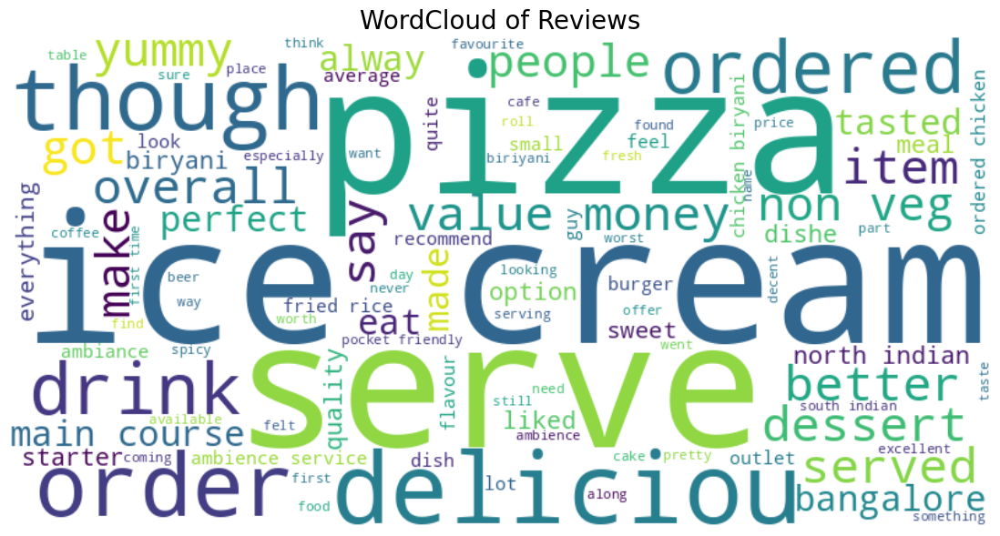

In [29]:
all_text= ' '.join(filtered_words)
word_cloud=WordCloud(
    width=800,
    height=400,
    background_color='white',
    max_words=100
).generate(all_text)

plt.figure(figsize=(15,7))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of Reviews', fontsize=20)
plt.show()

### 7.2 Category-Specific Word Clouds

### **Deep Dive:** Examine the vocabulary used for each dining experience category.


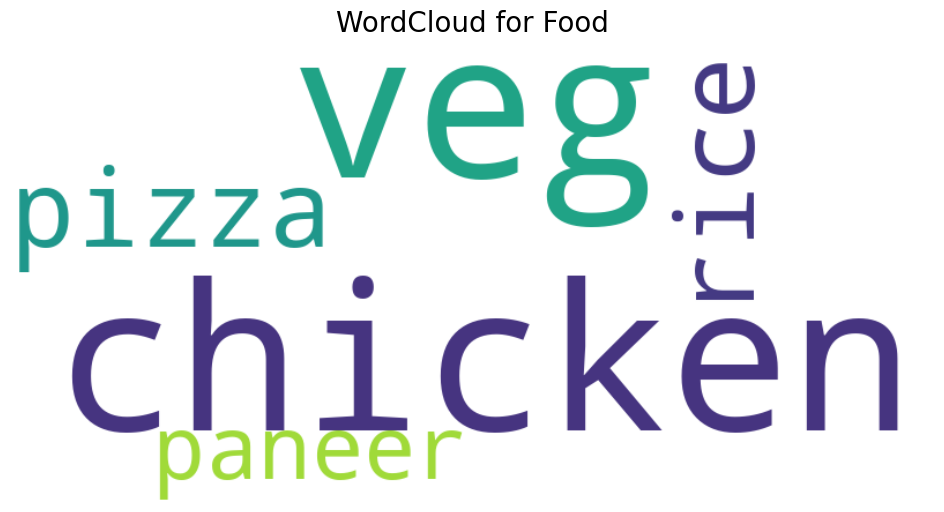

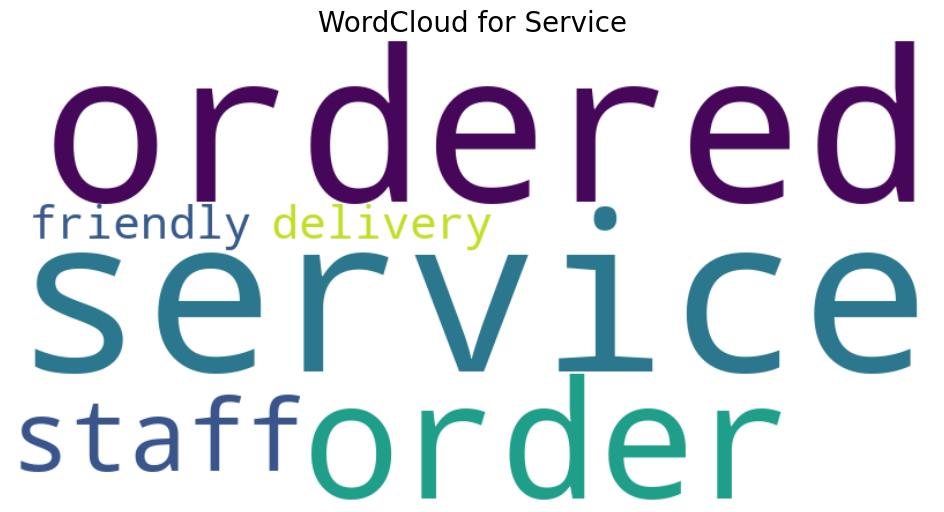

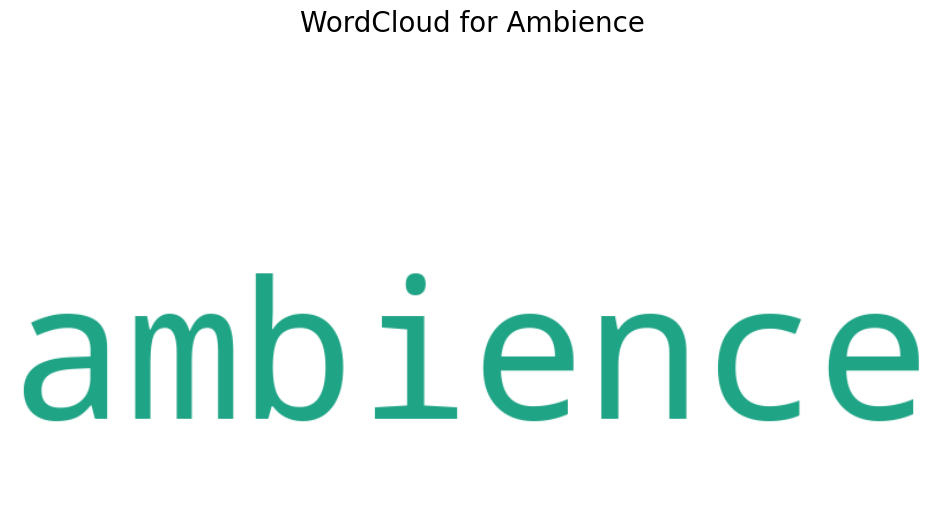

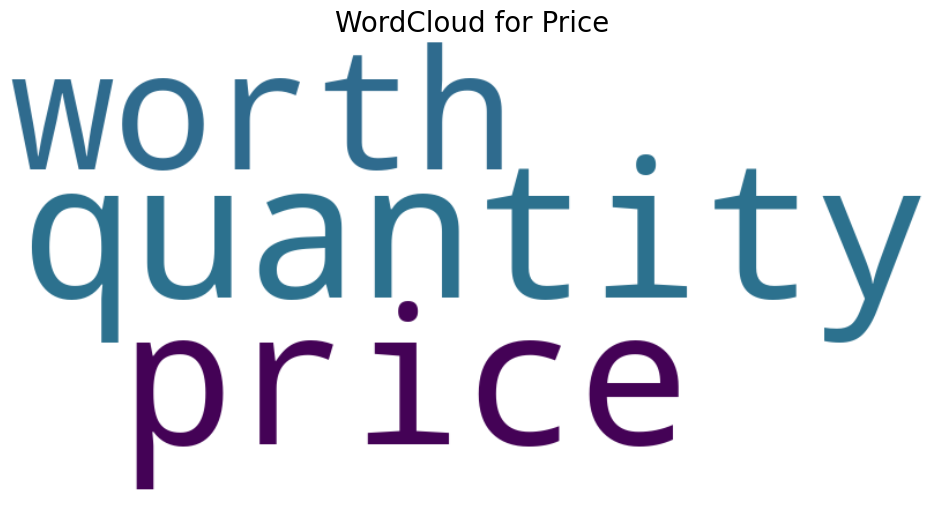

In [30]:
categories = ['Food', 'Service', 'Ambience','Price']

for cat in categories:
    words=top_words_df[top_words_df['category']==cat]['word']
    text= ' '.join(words)

    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        max_words=50
    ).generate(text)
    
    plt.figure(figsize=(12,6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'WordCloud for {cat}', fontsize=20)
    plt.show()

## 8. Manual Sentiment Analysis

### 8.1 Define Sentiment Lexicons

### **Methodology:** Use predefined word lists to classify reviews as positive, negative, or neutral. Account for negation words to improve accuracy.


In [31]:
positive_words = set(['good', 'great', 'amazing', 'nice', 'excellent', 'tasty', 'friendly', 'love', 'loved', 'best', 'awesome', 'perfect', 'fresh', 'delicious', 'yum', 'pocket_friendly','yummy'])
negative_words = set(['bad', 'worst', 'slow', 'poor', 'rude', 'disappointing', 'overpriced', 'cold', 'delay', 'unfriendly', 'unresponsive', 'pathetic', 'terrible', 'stale'])
neutral_words = set(['okay', 'ok', 'average', 'mediocre', 'normal', 'fine', 'decent', 'fair', 'regular'])
negation_tokens = set(['not', 'no', 'neither', 'never', 'isnt', 'wasnt', 'dont', 'didnt'])


In [32]:
df_exploded=df_exploded.dropna(subset=['review_text'])

### 8.2 Implement Sentiment Counting Function

### **Key Feature:** Negation handling to flip sentiment when negative words precede positive/negative terms.


In [33]:
def get_sentiment_counts(text):

    if not isinstance(text, str) or pd.isna(text):
        return 0, 0, 0


    words = text.split()

    pos, neg, neu = 0, 0, 0
    i = 0

    while i < len(words):
        word = words[i]

        if word in negation_tokens and (i + 1) < len(words):
            next_word = words[i + 1]
            if next_word in positive_words:
                neg += 1
                i += 2
                continue
            elif next_word in negative_words:
                pos += 1
                i += 2
                continue
            elif next_word in neutral_words:
                neu += 1
                i += 2
                continue

        if word in positive_words:
            pos += 1
        elif word in negative_words:
            neg += 1
        elif word in neutral_words:
            neu += 1

        i += 1

    return pos, neg, neu

In [34]:
results=df_exploded['review_text'].apply(get_sentiment_counts).tolist()
df_exploded[['pos_count', 'neg_count', 'neu_count']]=pd.DataFrame(results, index=df_exploded.index)

In [35]:
df_exploded

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,cuisines_count,chain_label,cuisines_list,rate_group,parsed_reviews,review_rating,review_text,pos_count,neg_count,neu_count
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n A beautiful place to dine...",4.0,a beautiful place to dine in.the interiors tak...,0,0,0
1,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n I was here for dinner wit...",4.0,i was here for dinner with my family on a week...,6,0,0
2,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 2.0, RATED\n Its a restaurant near to ...",2.0,its a restaurant near to banashankari bda. me ...,0,0,1
3,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 4.0, RATED\n We went here on a weekend...",4.0,we went here on a weekend and one of us had th...,3,0,0
4,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"(Rated 5.0, RATED\n The best thing about the ...",5.0,the best thing about the place is it s ambianc...,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1325257,bar bar,No,Yes,4.1,1003,whitefield,bar& casual dining,"Mocktails, Cocktails, Pizza, Chicken Tikka, Na...","continental, italian, north indian",1500.0,...,3,Chain,"['continental', 'italian', 'north indian']",4-5,"(Rated 4.0, RATED\n More than the food, i gue...",4.0,"more than the food, i guess the happy, lively ...",2,0,0
1325258,bar bar,No,Yes,4.1,1003,whitefield,bar& casual dining,"Mocktails, Cocktails, Pizza, Chicken Tikka, Na...","continental, italian, north indian",1500.0,...,3,Chain,"['continental', 'italian', 'north indian']",4-5,"(Rated 4.0, RATED\n Today evening I visited t...",4.0,today evening i visited this place . best thin...,1,0,0
1325499,bhagini,No,No,2.5,81,whitefield,bar& casual dining,"Biryani, Andhra Meal","andhra, chinese, north indian, south indian",800.0,...,4,Chain,"['andhra', 'chinese', 'north indian', 'south i...",2-3,"(Rated 4.0, RATED\n A fine place to chill aft...",4.0,"a fine place to chill after office hours, reas...",1,0,1
1325500,bhagini,No,No,2.5,81,whitefield,bar& casual dining,"Biryani, Andhra Meal","andhra, chinese, north indian, south indian",800.0,...,4,Chain,"['andhra', 'chinese', 'north indian', 'south i...",2-3,"(Rated 3.0, RATED\n Thank God bhagini replace...",3.0,thank god bhagini replaced the old and phathet...,4,0,0


### 8.3 Assign Sentiment Labels

### **Classification Rule:** The sentiment category with the highest word count determines the overall label.


In [36]:
def label_sentiment(row):
    counts={'Praise': row['pos_count'], 'Complaint': row['neg_count'], 'Neutral': row['neu_count']}

    if sum(counts.values())==0:
        return 'Neutral'
    return max(counts, key=counts.get)
        

In [37]:
df_exploded['sentiment'] = df_exploded.apply(label_sentiment,axis=1)

### 8.4 Sentiment Distribution Visualization

### What is the overall sentiment distribution of customer reviews?


In [38]:
fig = px.pie(
    df_exploded, 
    names='sentiment', 
    title='Customer Reviews Sentiment Distribution',
    color='sentiment',
    color_discrete_map={'Praise':'green','Neutral':'gray','Complaint':'red'}
)

fig.show()

## 9. Restaurant Performance Analysis

### 9.1 Calculate Average Sentiment Scores by Restaurant


In [39]:
sentiment_map = {'Praise': 1, 'Neutral': 0, 'Complaint': -1}
df_exploded['sentiment_score'] = df_exploded['sentiment'].map(sentiment_map)

### Identify top-performing restaurants based on sentiment analysis.

In [40]:
restaurant_sentiment = df_exploded.groupby('name')['sentiment_score'].mean().sort_values(ascending=False)
top_10=restaurant_sentiment.head(10)

print("Top 10 Restaurants by Sentiment:")
print(top_10)

Top 10 Restaurants by Sentiment:
name
zyara                                        1.0
#feeltheroll                                 1.0
zoroy luxury chocolate                       1.0
#refuel                                      1.0
#vibes restro                                1.0
zayakedar                                    1.0
zamindars biryani durbar                     1.0
zam zam darbar                               1.0
24 hours coffee drop - la classic            1.0
21 c - la marvella sarovar premiere hotel    1.0
Name: sentiment_score, dtype: float64


### 9.2 Visualize Top 10 Restaurants

In [41]:
top_10_df = top_10.reset_index()
top_10_df.columns = ['Restaurant', 'Avg_Sentiment']

fig = px.bar(
    top_10_df,
    x='Restaurant',
    y='Avg_Sentiment',
    title='Top 10 Restaurants by Average Sentiment',
    text='Avg_Sentiment',
    color='Avg_Sentiment',
    color_continuous_scale='Viridis'
)

fig.update_traces(textposition='outside')
fig.update_layout(
    xaxis_title='Restaurant Name',
    yaxis_title='Average Sentiment Score'
)

fig.show()


## 10. VADER Sentiment Analysis

### 10.1 Apply VADER (Valence Aware Dictionary and sEntiment Reasoner)

### **Comparison Method:** Use a pre-trained sentiment analysis tool to validate our manual sentiment classification.


In [42]:
nltk.download('vader_lexicon')
sia=SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [43]:
df_exploded['compound_score']=df_exploded['review_text'].astype(str).apply(
    lambda x: sia.polarity_scores(x)['compound']
)

In [44]:
def vader_label(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

In [45]:
df_exploded['vader_sentiment']=df_exploded['compound_score'].apply(vader_label)

### 10.2 VADER Sentiment Distribution

In [46]:
fig_custmer_sen = px.pie(
    df_exploded,
    names='vader_sentiment',
    title='Distribution of Review Sentiment',
    color='vader_sentiment',
    color_discrete_map={'Positive':'green','Neutral':'gray','Negative':'red'}
)
fig_custmer_sen.show()

### 10.3 Compare Manual vs VADER Sentiment

### **Analysis:** How do our manual sentiment labels compare with VADER's automated classification?


In [47]:
comparison_df = df_exploded.groupby(['sentiment', 'vader_sentiment']).size().reset_index(name='count')
comparison_df

,sentiment,vader_sentiment,count
0,Complaint,Negative,9427
1,Complaint,Neutral,510
2,Complaint,Positive,2107
3,Neutral,Negative,8236
4,Neutral,Neutral,6707
5,Neutral,Positive,19367
6,Praise,Negative,3894
7,Praise,Neutral,727
8,Praise,Positive,85636


In [48]:
fig = px.bar(
    comparison_df,
    x='sentiment',           
    y='count',
    color='vader_sentiment', 
    color_discrete_map={'Positive':'green','Neutral':'gray','Negative':'red'},
    title='Comparison: Manual Sentiment vs VADER Sentiment',
    text='count'
)

fig.update_traces(textposition='outside')
fig.update_layout(
    xaxis_title='Manual Sentiment',
    yaxis_title='Number of Reviews',
    barmode='group'
)

fig.show()

----------------------------------------------

## 11. Rating Analysis and Comparison

### 11.1 Clean and Standardize Official Ratings


In [49]:
def handel_rate(r):
    try:
        return round(float(r[0:3]), 1)
    except:
        return np.nan
        
df_exploded["rate"]=df_exploded["rate"].apply(handel_rate)

### 11.2 Calculate Average Review Ratings


In [50]:
reviews_avg=df_exploded.groupby('name')['review_rating'].mean().reset_index()
reviews_avg.columns=['name', 'Avg_review_rating']

In [51]:
reviews_avg

,name,Avg_review_rating
0,#feeltheroll,4.833333
1,#l-81 cafe,4.166667
2,#refuel,3.250000
3,#vibes restro,5.000000
4,1 fahreheit,4.500000
...,...,...
6979,zoey's,3.714286
6980,zoroy luxury chocolate,4.000000
6981,zu's doner kebaps,3.735294
6982,zyara,3.000000


### 11.3 Merge Official and Calculated Ratings

In [52]:
comparison_rate_df= df_exploded[['name', 'rate','votes']].drop_duplicates().merge(reviews_avg, on='name')

In [53]:
comparison_rate_df

,name,rate,votes,Avg_review_rating
0,jalsa,NaN,775,3.961538
1,spice elephant,NaN,787,3.571429
2,san churro cafe,NaN,918,3.208333
3,addhuri udupi bhojana,NaN,88,3.720000
4,grand village,NaN,166,4.000000
...,...,...,...,...
13432,little onnion,NaN,134,3.736842
13433,fujian express,NaN,182,3.575000
13434,nook - aloft bengaluru cessna business park,NaN,411,3.866667
13435,seeya restaurant,NaN,4,3.500000


### 11.4 Identify Rating Gaps

### **Trust Gap Analysis:** Calculate the difference between official ratings and actual review averages.


In [54]:
comparison_rate_df['rating_gap']=comparison_rate_df['rate']-comparison_rate_df['Avg_review_rating']

### 11.5 Most Disappointing Restaurants

### Which restaurants have the largest positive rating gap (official rating exceeds review average)?


In [55]:
disappointing_restaurants = comparison_rate_df.sort_values(by='rating_gap', ascending=False)
disappointing_restaurants.head(5)

,name,rate,votes,Avg_review_rating,rating_gap
0,jalsa,NaN,775,3.961538,NaN
1,spice elephant,NaN,787,3.571429,NaN
2,san churro cafe,NaN,918,3.208333,NaN
3,addhuri udupi bhojana,NaN,88,3.720000,NaN
4,grand village,NaN,166,4.000000,NaN


### 11.6 Visualize Rating Comparison
#### **Interactive Scatter Plot:** Compare official ratings with calculated review averages, sized by vote count and colored by trust gap.


In [56]:
fig_disapoint_rest = px.scatter(
    comparison_rate_df, 
    x='rate', 
    y='Avg_review_rating',
    size='votes',             
    color='rating_gap',       
    hover_name='name',       
    hover_data={
        'rate': ':.2f', 
        'Avg_review_rating': ':.2f', 
        'rating_gap': ':.2f',
        'votes': True
    },
    color_continuous_scale='RdBu_r', 
    title='Zomato Bangalore: Official Rating vs. Actual Review Average',
    labels={
        'rate': 'Official Rating',
        'Avg_review_rating': 'Reviews Avg (Calculated)',
        'rating_gap': 'Trust Gap'
    },
    template='plotly_dark'     
)


fig_disapoint_rest.add_trace(
    go.Scatter(
        x=[2, 5], y=[2, 5], 
        mode='lines', 
        line=dict(color='white', dash='dash'),
        name='Perfect Agreement'
    )
)

fig_disapoint_rest.show()

## 12. Sentiment-Rating Relationship Analysis


### 12.1 Rating Distribution by Sentiment Category

### How do official ratings vary across different sentiment categories?


In [57]:
fig_rate_sent = px.box(
    df_exploded,
    x='sentiment',
    y='rate',
    title='Rating Distribution by Sentiment',
    color='sentiment'
)
fig_rate_sent.show()


### 12.2 Sentiment Score vs Rating Correlation

### **Relationship Analysis:** Examine the correlation between VADER sentiment scores and official ratings.


In [58]:
fig = px.scatter(
    df_exploded,
    x='compound_score',
    y='rate',
    color='sentiment',
    title='Sentiment Score vs Rating',
    labels={
        'compound_score': 'Sentiment Score',
        'rate': 'Rating'
    }
)
fig.show()


## 13. Anomaly Detection: Mismatched Ratings and Sentiment

### 13.1 High-Rated Restaurants with Negative Reviews

#### **Anomaly Type:** Restaurants with official ratings ≥4 but negative sentiment (compound score < -0.2).

In [59]:
high_rate_negative=df_exploded[
(df_exploded['rate']>=4) &(df_exploded['compound_score']<-0.2)
]

high_rate_negative[
    ['rate', 'compound_score', 'sentiment', 'review_text']
].head()


,rate,compound_score,sentiment,review_text


### 13.2 Low-Rated Restaurants with Positive Reviews

#### **Anomaly Type:** Restaurants with official ratings ≤2 but positive sentiment (compound score > 0.2).


In [60]:
low_rate_positive=df_exploded[
(df_exploded['rate']<=2) & (df_exploded['compound_score'] > 0.2)
]

low_rate_positive[
    ['rate', 'compound_score', 'sentiment', 'review_text']
].head()

,rate,compound_score,sentiment,review_text


### 13.3 High Review Ratings with Negative Sentiment

#### **Individual Review Anomaly:** Reviews with high individual ratings but negative text sentiment.


In [61]:
high_review_rate_negative=df_exploded[
(df_exploded['review_rating']>=4) &(df_exploded['compound_score']<-0.2)
]

high_rate_negative[
    ['review_rating', 'compound_score', 'sentiment', 'review_text']
].head()


,review_rating,compound_score,sentiment,review_text


### 13.4 Low Review Ratings with Positive Sentiment


In [62]:
low_review_rate_positive=df_exploded[
(df_exploded['review_rating']<=2) & (df_exploded['compound_score'] > 0.2)
]

low_rate_positive[
    ['review_rating', 'compound_score', 'sentiment', 'review_text']
].head()

,review_rating,compound_score,sentiment,review_text


### 13.5 Quantify Anomaly Prevalence

#### **Statistical Summary:** What percentage of reviews show rating-sentiment mismatches?


In [63]:
print("High rate + Negative %:", round(len(high_rate_negative)/len(df_exploded)*100 , 2))
print("Low rate + Positive %:" , round(len(low_rate_positive)/len(df_exploded)*100, 2))


High rate + Negative %: 0.0
Low rate + Positive %: 0.0


In [64]:
print("High rate + Negative %:", round(len(high_review_rate_negative)/len(df_exploded)*100 , 2))
print("Low rate + Positive %:" , round(len(low_review_rate_positive)/len(df_exploded)*100, 2))

High rate + Negative %: 0.73
Low rate + Positive %: 4.5


## 14. Location-Based Sentiment Analysis

### 14.1 Sentiment Distribution by Location

### Which locations have the most positive or negative reviews?


In [65]:
df_exploded['location']=df_exploded['location'].str.lower().str.strip()

In [66]:
sentiment_location = df_exploded.groupby(['location','sentiment']).size().reset_index(name='Count')

fig_sentiment_loc = px.bar(
    sentiment_location,
    x='location',
    y='Count',
    color='sentiment',
    title='Sentiment Distribution per Location',
    barmode='group'
    
)
fig_sentiment_loc.update_layout(xaxis_tickangle=-45)

fig_sentiment_loc.show()


In [67]:
import pickle

figures = {
    "fig_custmer_sen": fig_custmer_sen,
    "fig_disapoint_rest": fig_disapoint_rest,
    "fig_rate_sent": fig_rate_sent,
    "fig_sentiment_loc": fig_sentiment_loc

}


with open("all_figures_review.pkl", "wb") as f:
    pickle.dump(figures, f)

print("All figures saved in 'all_figures_review.pkl'")

All figures saved in 'all_figures_review.pkl'


In [68]:
df.head(10)

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,rate_missing,rate_missing_label,is_chain,chain_size,num_of_rest_types,cuisines_count,chain_label,cuisines_list,rate_group,parsed_reviews
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,False,Available,1,11,1,3,Chain,"['chinese', 'mughlai', 'north indian']",4-5,"[(Rated 4.0, RATED\n A beautiful place to din..."
1,spice elephant,Yes,No,4.1,787,banashankari,casual dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","chinese, north indian, thai",800.0,...,False,Available,1,4,1,3,Chain,"['chinese', 'north indian', 'thai']",4-5,"[(Rated 4.0, RATED\n Had been here for dinner..."
2,san churro cafe,Yes,No,3.8,918,banashankari,cafe& casual dining,"Churros, Cannelloni, Minestrone Soup, Hot Choc...","cafe, italian, mexican",800.0,...,False,Available,1,11,2,3,Chain,"['cafe', 'italian', 'mexican']",3-4,"[(Rated 3.0, RATED\n Ambience is not that goo..."
3,addhuri udupi bhojana,No,No,3.7,88,banashankari,quick bites,Masala Dosa,"north indian, south indian",300.0,...,False,Available,1,2,1,2,Chain,"['north indian', 'south indian']",3-4,"[(Rated 4.0, RATED\n Great food and proper Ka..."
4,grand village,No,No,3.8,166,basavanagudi,casual dining,"Panipuri, Gol Gappe","north indian, rajasthani",600.0,...,False,Available,1,4,1,2,Chain,"['north indian', 'rajasthani']",3-4,"[(Rated 4.0, RATED\n Very good restaurant in ..."
5,timepass dinner,Yes,No,3.8,286,basavanagudi,casual dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",north indian,600.0,...,False,Available,1,7,1,1,Chain,['north indian'],3-4,"[(Rated 3.0, RATED\n Food 3/5\nAmbience 3/5\n..."
6,rosewood international hotel - bar & restaurant,No,No,3.6,8,mysore road,casual dining,NaN,"andhra, chinese, north indian, south indian",800.0,...,False,Available,1,3,1,4,Chain,"['andhra', 'chinese', 'north indian', 'south i...",3-4,"[(Rated 5.0, RATED\n Awesome food ??Great ser..."
7,onesta,Yes,Yes,4.6,2556,banashankari,cafe& casual dining,"Farmhouse Pizza, Chocolate Banana, Virgin Moji...","cafe, italian, pizza",600.0,...,False,Available,1,85,2,3,Chain,"['cafe', 'italian', 'pizza']",4-5,"[(Rated 5.0, RATED\n I personally really like..."
8,penthouse cafe,Yes,No,4.0,324,banashankari,cafe,"Pizza, Mocktails, Coffee, Nachos, Salad, Pasta...","cafe, continental, italian",700.0,...,False,Available,1,7,1,3,Chain,"['cafe', 'continental', 'italian']",3-4,"[(Rated 3.0, RATED\n I had been to this place..."
9,smacznego,Yes,No,4.2,504,banashankari,cafe,"Waffles, Pasta, Coleslaw Sandwich, Choco Waffl...","beverages, cafe, italian, mexican, momos",550.0,...,False,Available,1,7,1,5,Chain,"['beverages', 'cafe', 'italian', 'mexican', 'm...",4-5,"[(Rated 4.0, RATED\n Easy to locate\nVFM 3.5/..."


In [69]:
df_exploded.head(10)

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,parsed_reviews,review_rating,review_text,pos_count,neg_count,neu_count,sentiment,sentiment_score,compound_score,vader_sentiment
0,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n A beautiful place to dine...",4.0,a beautiful place to dine in.the interiors tak...,0,0,0,Neutral,0,0.7430,Positive
1,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n I was here for dinner wit...",4.0,i was here for dinner with my family on a week...,6,0,0,Praise,1,0.9623,Positive
2,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 2.0, RATED\n Its a restaurant near to ...",2.0,its a restaurant near to banashankari bda. me ...,0,0,1,Neutral,0,0.7964,Positive
3,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n We went here on a weekend...",4.0,we went here on a weekend and one of us had th...,3,0,0,Praise,1,0.9678,Positive
4,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 5.0, RATED\n The best thing about the ...",5.0,the best thing about the place is it s ambianc...,3,0,0,Praise,1,0.9702,Positive
5,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 5.0, RATED\n Great food and pleasant a...",5.0,great food and pleasant ambience. expensive bu...,3,0,0,Praise,1,0.9382,Positive
6,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n Good ambience with tasty ...",4.0,good ambience with tasty food. cheese chilli p...,3,0,0,Praise,1,0.8291,Positive
7,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n You canÃÃÃÃÃÃ...",4.0,you can t go wrong with jalsa. never been a fa...,0,0,0,Neutral,0,-0.0467,Neutral
8,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 5.0, RATED\n Overdelighted by the serv...",5.0,overdelighted by the service and food provided...,0,0,0,Neutral,0,0.8399,Positive
9,jalsa,Yes,Yes,NaN,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800.0,...,"(Rated 4.0, RATED\n The place is nice and com...",4.0,the place is nice and comfortable. food wise a...,2,0,0,Praise,1,0.9124,Positive


In [70]:
df_summary = (
    df_exploded
    .groupby("item_id")
    .agg({
        "review_rating": "mean",        
        "pos_count": "sum",            
        "neg_count": "sum",             
        "neu_count": "sum",             
        "compound_score": "mean",       
        "sentiment_score": "mean"       
    })
    .reset_index()
)


In [71]:
df_final = df.merge(df_summary, on="item_id", how="left")

In [72]:
df_final.to_csv('df_final.csv')